In [1]:
import os
import sys
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
set_session(tf.Session(config=config))

import sys
sys.path.append("/home/weixin/Documents/MyProjects/DVS_results_comparison/utils/proposed")
sys.path.append("/home/weixin/Documents/MyProjects/DVS_results_comparison/utils/DnCNN")
sys.path.append("/home/weixin/Documents/MyProjects/DVS_results_comparison/utils/ffdnet-pytorch/")

import glob
from skimage.measure import compare_psnr, compare_ssim
from skimage.io import imread, imsave
import numpy as np
import scipy.misc

import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import time
from keras.models import load_model

Using TensorFlow backend.


In [2]:
from models import FFDNet
from DnCNN import DnCNN as DnCNN
from pre_DnCNN import pre_DnCNN

In [3]:
################################################## load model #########################################

In [4]:
# DNCNN model trained on guassian noise (0,55)
comp_model_1 = pre_DnCNN(depth=20,filters=64,image_channels=1, use_bnorm=True)
comp_model_1_save_dir = "/home/weixin/Documents/MyProjects/DVS_results_comparison/models/DnCNN/"
comp_model_1.load_weights(os.path.join(comp_model_1_save_dir,"model_150.hdf5"), by_name=True)

In [5]:
# FFDNET pre trained
model = FFDNet(num_input_channels=1, test_mode=True)
model_save_dir = "/home/weixin/Documents/MyProjects/DVS_results_comparison/models/FFDNET/net_gray.pth"
state_dict = torch.load(model_save_dir)
device_ids = [0]
comp_model_2 = nn.DataParallel(model, device_ids=device_ids).cuda()
comp_model_2.load_state_dict(state_dict)

In [6]:
# proposed 
proposed_sse = DnCNN(depth=17,filters=64,image_shape=(None,None,1),use_bnorm=True)
proposed_mse = DnCNN(depth=17,filters=64,image_shape=(None,None,1),use_bnorm=True)
proposed_sse_save_dir = "/home/weixin/Documents/MyProjects/DVS_results_comparison/models/proposed/sse_model_150.hdf5"
proposed_mse_save_dir = "/home/weixin/Documents/MyProjects/DVS_results_comparison/models/proposed/mse_model_150.hdf5"
proposed_sse.load_weights(proposed_sse_save_dir,by_name=True)
proposed_mse.load_weights(proposed_mse_save_dir,by_name=True)

In [7]:
##############################################  test dataset ##############################################

In [8]:
def create_folder(fig_save_dir,filename,index):
    fig_path = os.path.join(fig_save_dir,filename[index])
    if not os.path.exists(fig_save_dir):
        os.mkdir(fig_save_dir)
    if not os.path.exists(fig_path):
        os.mkdir(fig_path)
    return fig_path

def save_image(fig_save_dir,filename,img,para):
    fig_name = filename+'_pred_'+para+'.png'
    scipy.misc.toimage(img, cmin=np.min(img), 
                   cmax=np.max(img)).save(os.path.join(fig_save_dir,fig_name))
    print("predict file saved at %s" % os.path.join(fig_save_dir,fig_name))
    
def save_gt_img(fig_path,filename,index,gts):
    gt_image_name = filename[index]+"_gt.png"
    if not os.path.isfile(os.path.join(fig_path,gt_image_name)):
        scipy.misc.toimage(gts[index], cmin=np.min(gts[index]), 
                       cmax=np.max(gts[index])).save(os.path.join(fig_path,gt_image_name))
        print("gt file saved at %s" % os.path.join(fig_path,gt_image_name))
    
def save_distorted_img(fig_path,filename,index,preds):
    distorted_image_name = filename[index]+"_distorted.png"
    if not os.path.isfile(os.path.join(fig_path,distorted_image_name)):
        scipy.misc.toimage(preds[index], cmin=np.min(preds[index]), 
                       cmax=np.max(preds[index])).save(os.path.join(fig_path,distorted_image_name))
        print("distorted file saved at %s" % os.path.join(fig_path,distorted_image_name))
    
def show_img_info(gts,preds,index,show_info=False):
    if show_info:
        print("In testing dataset, there are %d ground truth imgs and %d distorted imgs" % (len(gts),len(preds)))
        print("the shape of testing image is",gts[index].shape)
        print("distorted_max=%.3f,distorted_min=%.3f,gt_max=%.3f,gt_min=%.3f" % 
              (np.max(preds[index]),np.min(preds[index]),np.max(gts[index]),np.min(gts[index])))
        plt.figure(figsize=(20,10))
        plt.subplot(1,2,1)
        plt.imshow(gts[index])
        plt.title("gt")
        plt.subplot(1,2,2)
        plt.imshow(preds[index])
        plt.title("distorted")
        plt.show()
    
    noisy_image = preds[index]
    clean_image = gts[index]
    clean_image = clean_image.astype("float32")
    noisy_image = noisy_image.astype("float32")
    ssim = compare_ssim(clean_image,noisy_image)
    psnr = compare_psnr(clean_image,noisy_image)
    print(index," distorted img : ","psnr=",psnr,",ssim=",ssim)
    return ssim,psnr

In [9]:
##############################################  testing ##############################################

In [10]:
def find_best_sigma(device,model,index,preds,gts):
    noisy_image = preds[index]
    clean_image = gts[index]
    clean_image = clean_image.astype("float32")
    noisy_image = noisy_image.astype("float32")
    
    dis_img = np.reshape(noisy_image,(1,1,*noisy_image.shape))
    
    ssims = []
    psnrs = []
    for noise_level in range(100):
        std_var = torch.FloatTensor(np.array([noise_level/255])).to(device)
        inpt = torch.FloatTensor(dis_img).to(device)
        model = model.to(device)
        model.eval()
        noise_esti = model(inpt,std_var)
        out_val = torch.clamp(inpt-noise_esti, 0., 1.)
        predict = out_val.data.cpu().numpy()[0,0]

        ssim = compare_ssim(clean_image,predict)
        psnr = compare_psnr(clean_image,predict)
        ssims.append(ssim)
        psnrs.append(psnr)
        
    return int((np.argmax(ssims)+np.argmax(psnrs))/2)
#         print("sigma =", noise_level," psnr=",psnr,",ssim=",ssim)
#     print("for image %d, best sigma for ssim is %d, for psnr is %d, best one is %d" % 
#           (index,np.argmax(ssims),np.argmax(psnrs),int((np.argmax(ssims)+np.argmax(psnrs))/2)))

In [11]:
def result_predict(model,model_lib,index,preds,gts,plot_img=False,save_img=False,
                   noise_level=0,device=None,filename=None,fig_save_dir=None,para=None):
    noisy_image = preds[index]
    clean_image = gts[index]
    clean_image = clean_image.astype("float32")
    noisy_image = noisy_image.astype("float32")
    
    
    if model_lib=="KERAS":
        inpt = np.reshape(noisy_image,(1,*noisy_image.shape,1))
        tmp = time.time()
        predict = model.predict(inpt)
        time_cost = time.time()-tmp
#         print("time cost is: ",time.time()-tmp)
        predict = np.reshape(predict,(inpt.shape[1],inpt.shape[2]))
    else:
        dis_img = np.reshape(noisy_image,(1,1,*noisy_image.shape))
        std_var = torch.FloatTensor(np.array([noise_level/255])).to(device)
        inpt = torch.FloatTensor(dis_img).to(device)
        model = model.to(device)
        model.eval()
        tmp = time.time()
        noise_esti = model(inpt,std_var)
        out_val = torch.clamp(inpt-noise_esti, 0., 1.)
        time_cost = time.time()-tmp
        predict = out_val.data.cpu().numpy()[0,0]

    ssim = compare_ssim(clean_image,predict)
    psnr = compare_psnr(clean_image,predict)
#     print("predict: ","psnr=",psnr,",ssim=",ssim)
    
    if plot_img:
        plt.figure(figsize=(20,10))
        plt.subplot(1,3,1)
        plt.imshow(clean_image)
        plt.title("gt")
        plt.subplot(1,3,2)
        plt.imshow(noisy_image)
        plt.title("noisy image")
        plt.subplot(1,3,3)
        plt.imshow(predict)
        plt.title("prediction")
        plt.show()
    
    if save_img:
        save_image(fig_save_dir,filename[index],predict,para)
        save_gt_img(fig_save_dir,filename,index,gts)
        save_distorted_img(fig_save_dir,filename,index,preds)
        
    return ssim,psnr,predict,time_cost

        
        

In [12]:
def show_predicts(ssims,psnrs,para_list,predicts,time_costs):
    plt.figure(figsize=(20,20))
    for i in range(len(para_list)):
        plt.subplot(2,2,1+i)
        plt.imshow(predicts[i])
        plt.title('%s, ssim = %.3f, psnr = %.3f, t = %.4f' % (para_list[i],ssims[i],psnrs[i],time_costs[i]))
    plt.show()

In [13]:
data_dir = "/data/nfs_examples/"
filename = ['airplane','basketball','soccer','car_side','pingpong',
            'drone','Skiing_red','biker_acrobat','motorcross','billiard','motorcross_kawasaki','water_ski']
data_type = ['gt','pbr']
data_format = ['.npy']
fig_save_dir="/home/weixin/Documents/MyProjects/DVS_results_comparison/fig"

preds = []
gts = []
for dt in data_type:
    for fn in filename:
        datapath = os.path.join(data_dir,fn+'_'+dt+data_format[0])
        if dt == 'gt':
            gts.append(np.load(datapath)[0])
        else:
            if datapath == '/data/nfs_examples/water_ski_pbr.npy':
                datapath = '/data/nfs_examples/watet_ski_pbr.npy'
            preds.append(np.load(datapath)[0])

In [14]:
test_model = [proposed_sse, proposed_mse, comp_model_1,comp_model_2]
para_list = ["proposed_sse","proposed_mse","DnCNN_B","FFDNET"]
model_lib_list = ["KERAS","KERAS","KERAS","PYTORCH"]

# model_lib = "KERAS"
plot_img = False
save_img = False
noise_level=0
device = torch.device("cuda")




In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (550, 550)
distorted_max=0.996,distorted_min=-0.166,gt_max=1.000,gt_min=0.000


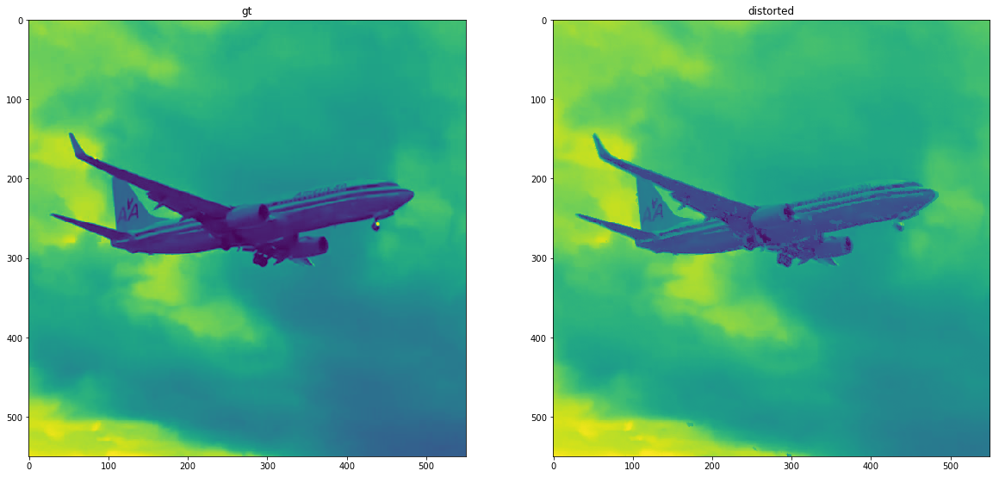

0  distorted img :  psnr= 30.9064381086 ,ssim= 0.975303125989


/home/weixin/Documents/MyProjects/DVS_results_comparison/utils/ffdnet-pytorch/models.py:100: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  concat_noise_x = Variable(concat_noise_x, volatile=True)


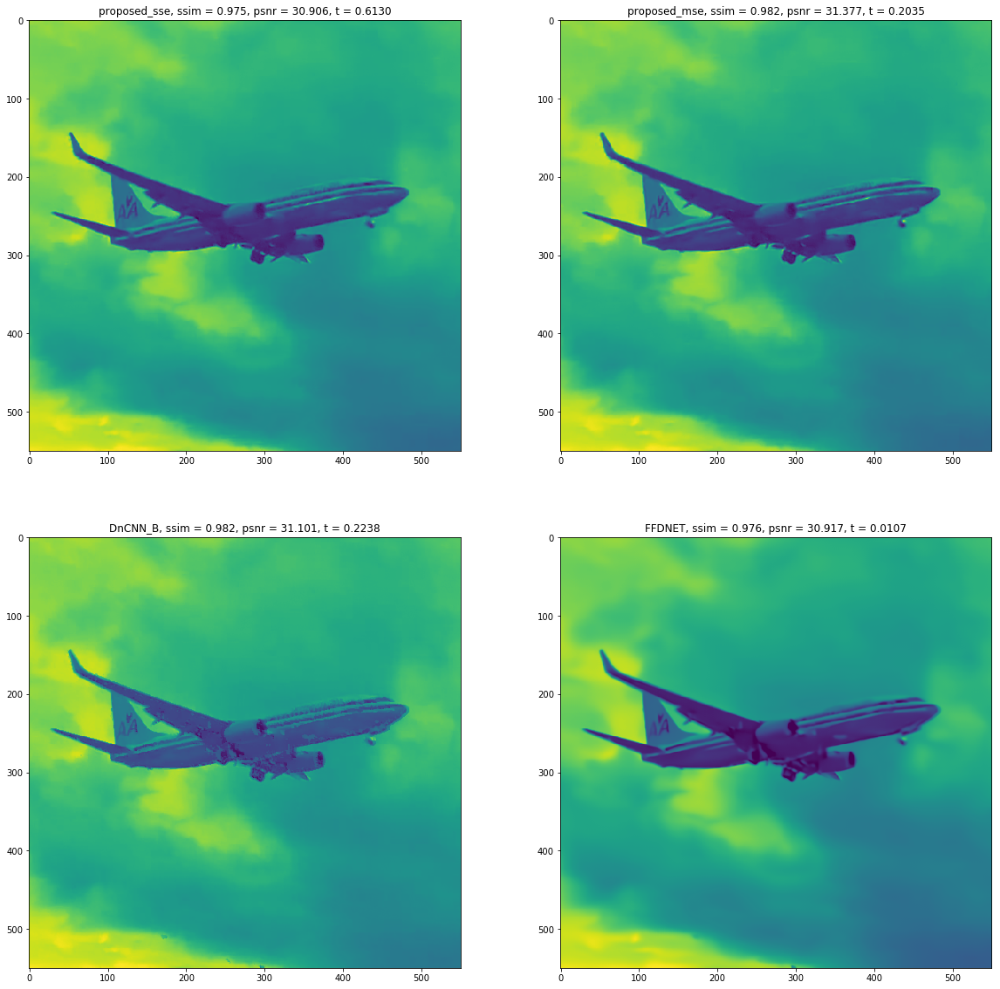

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (250, 250)
distorted_max=0.883,distorted_min=-0.155,gt_max=0.992,gt_min=0.000


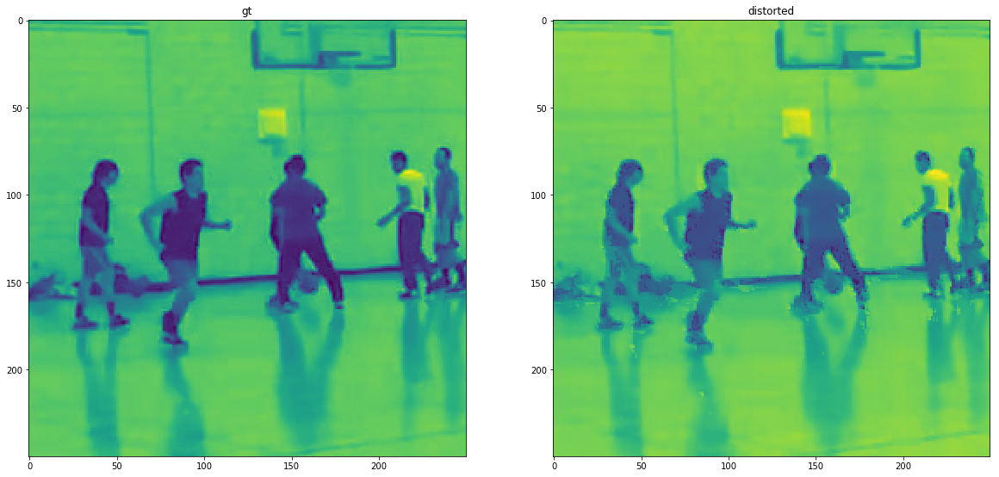

1  distorted img :  psnr= 23.5475207163 ,ssim= 0.963248638762


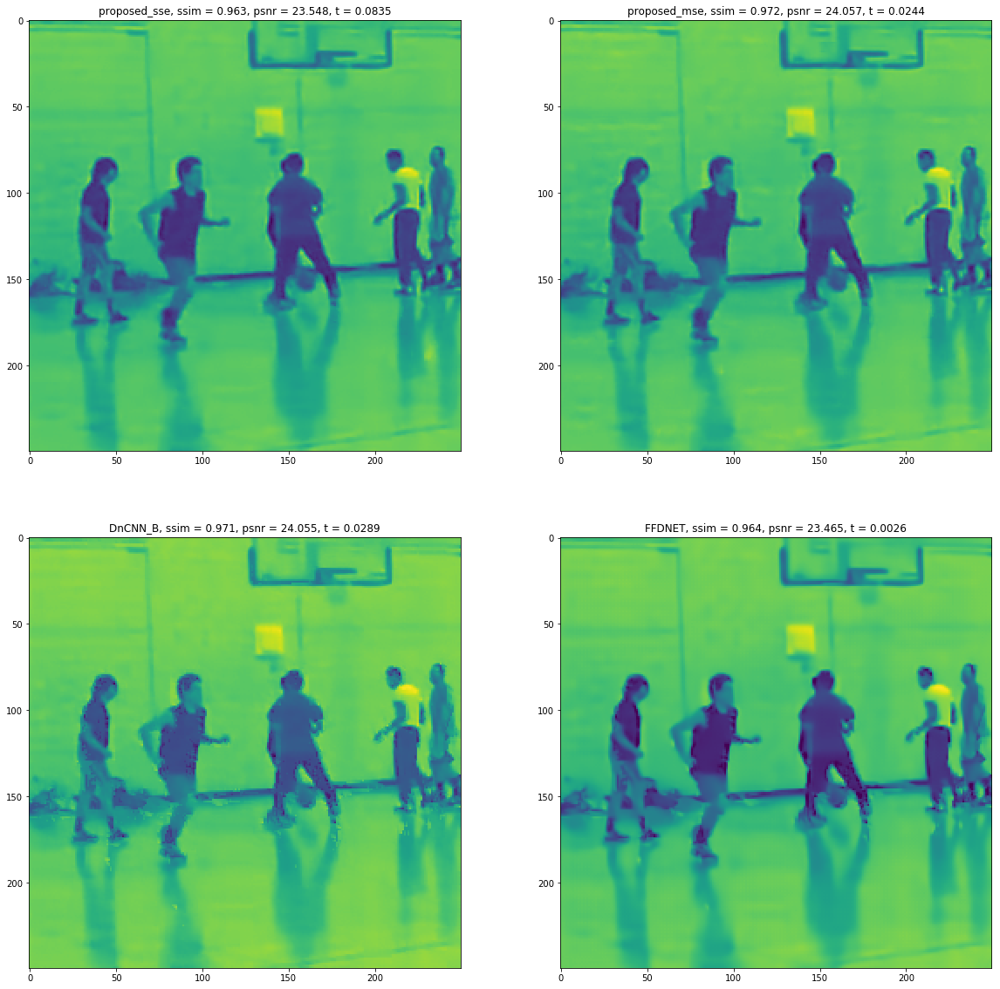

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (250, 250)
distorted_max=0.982,distorted_min=-0.132,gt_max=0.980,gt_min=0.000


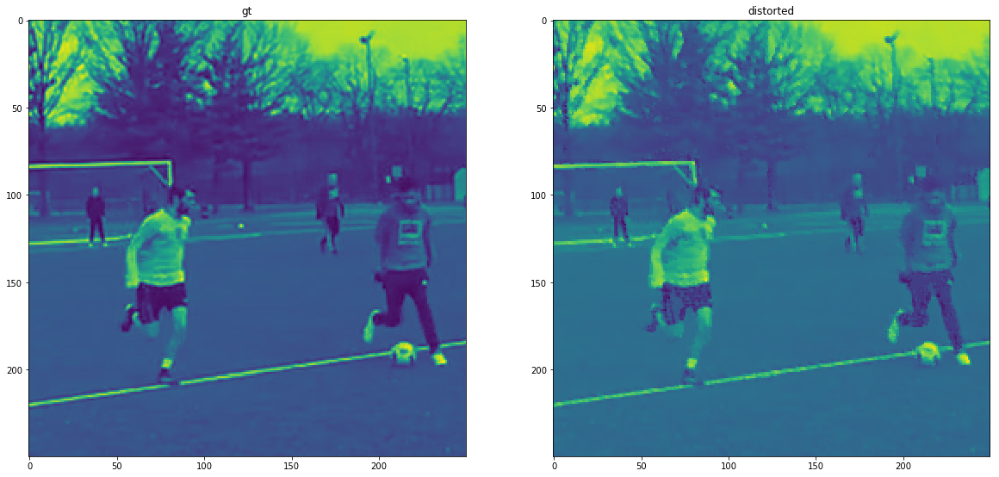

2  distorted img :  psnr= 29.9603644852 ,ssim= 0.960660851427


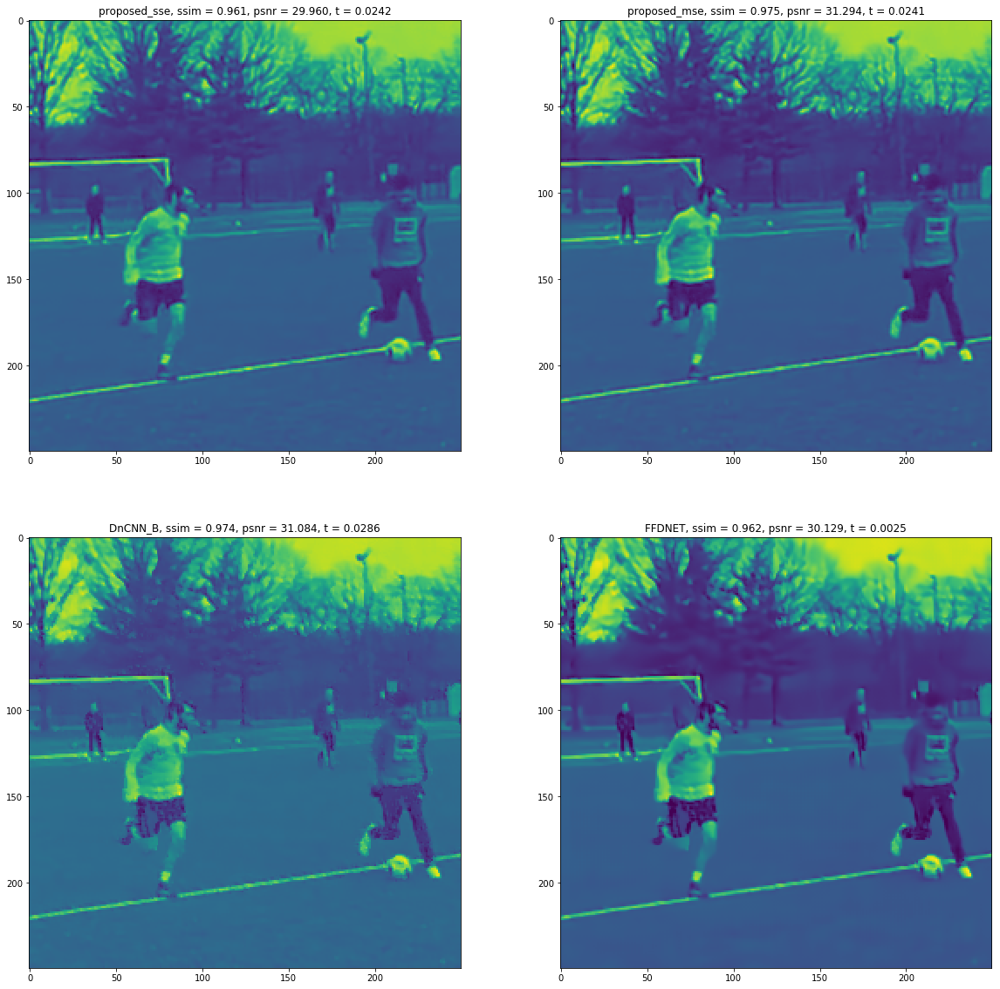

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (400, 400)
distorted_max=0.918,distorted_min=-0.119,gt_max=0.969,gt_min=0.008


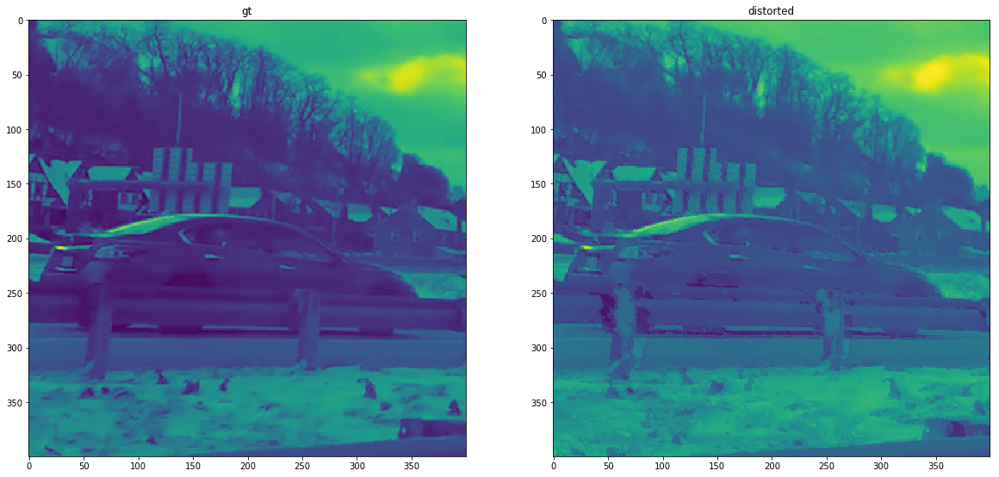

3  distorted img :  psnr= 30.007177955 ,ssim= 0.920919555829


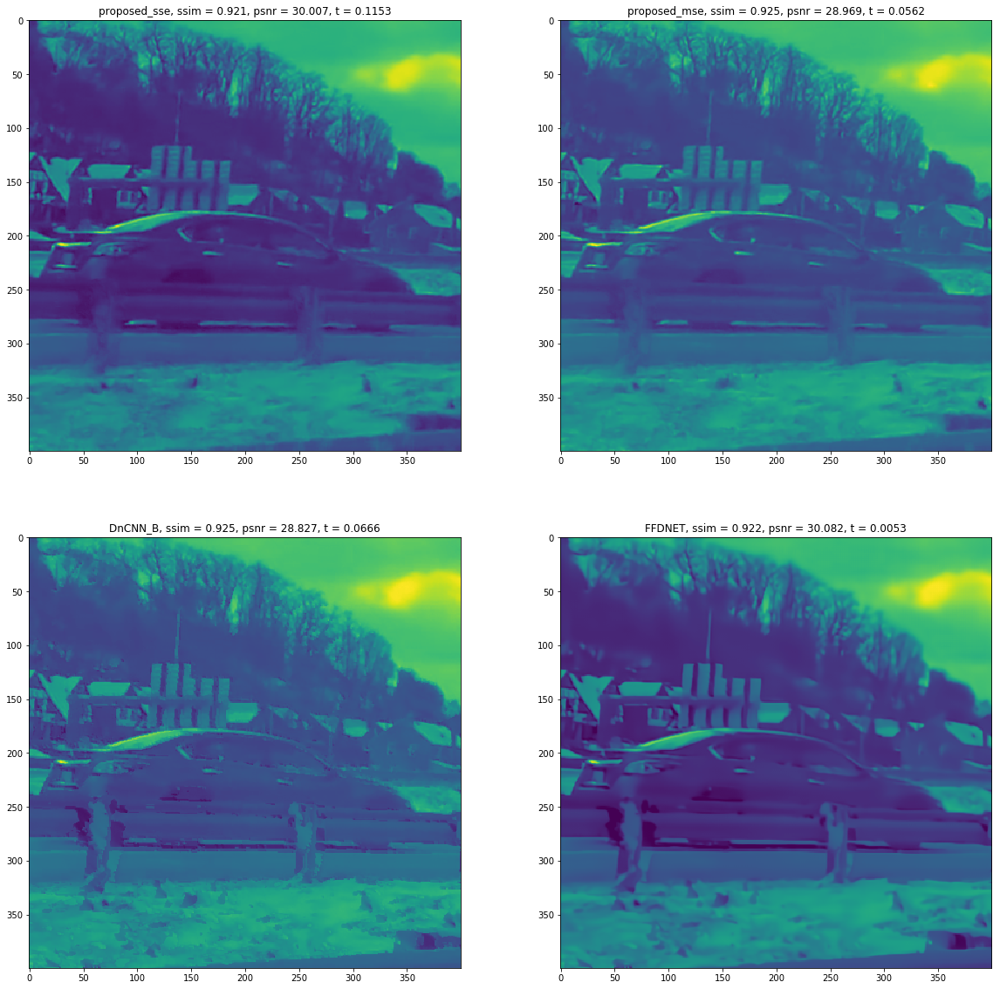

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.927,distorted_min=-0.162,gt_max=0.953,gt_min=0.004


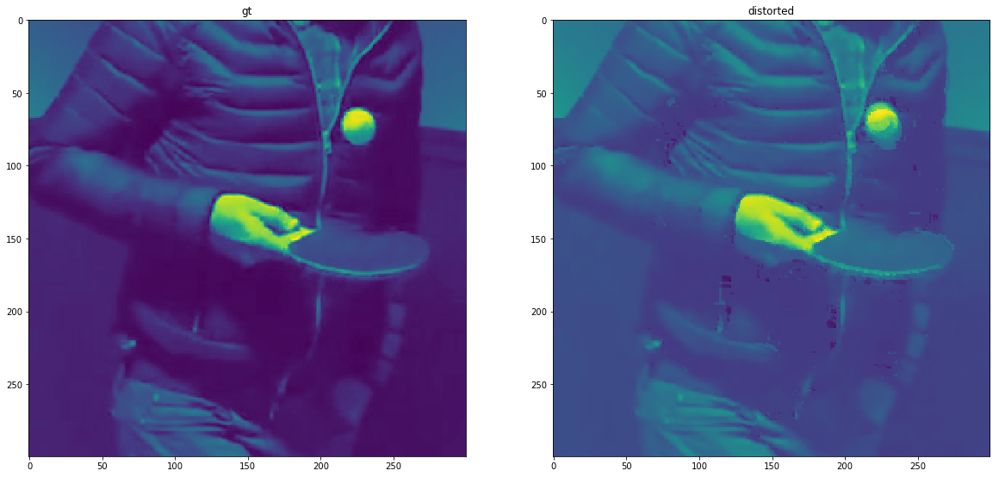

4  distorted img :  psnr= 32.4647836733 ,ssim= 0.974059222792


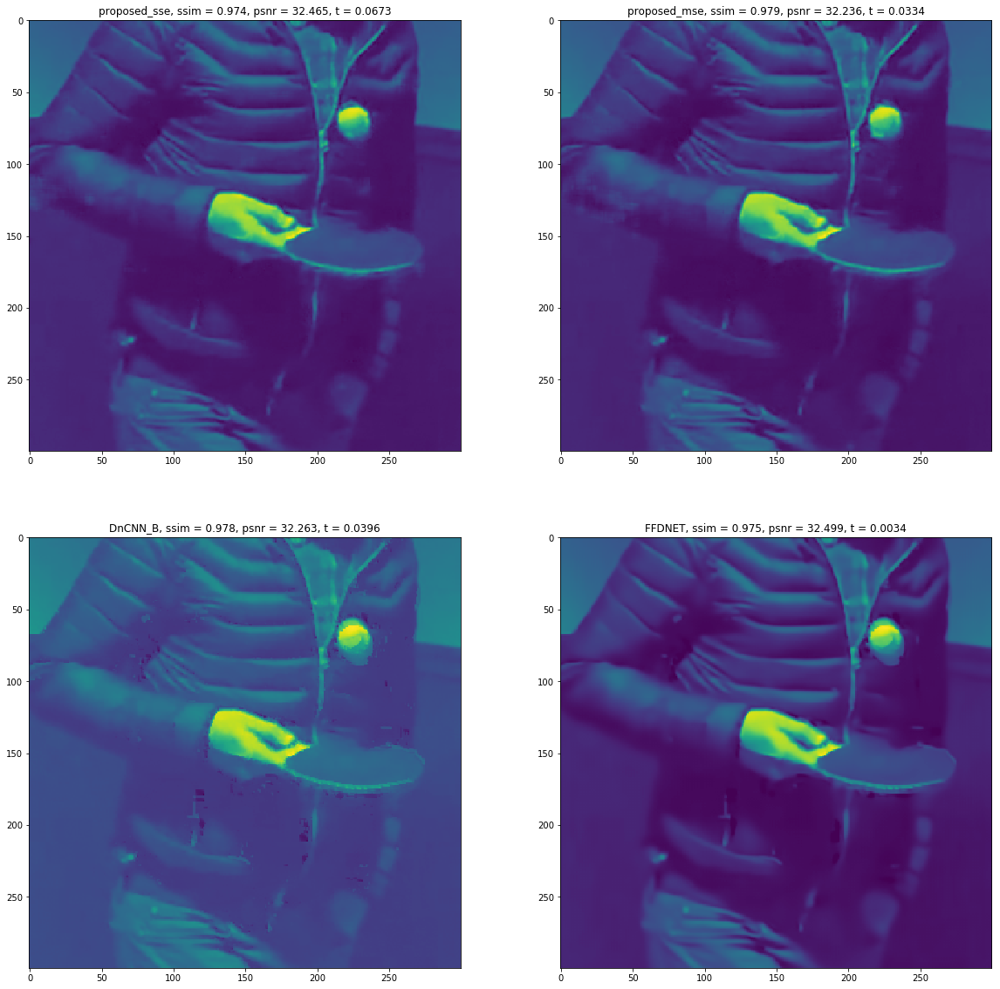

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.996,distorted_min=0.029,gt_max=0.996,gt_min=0.020


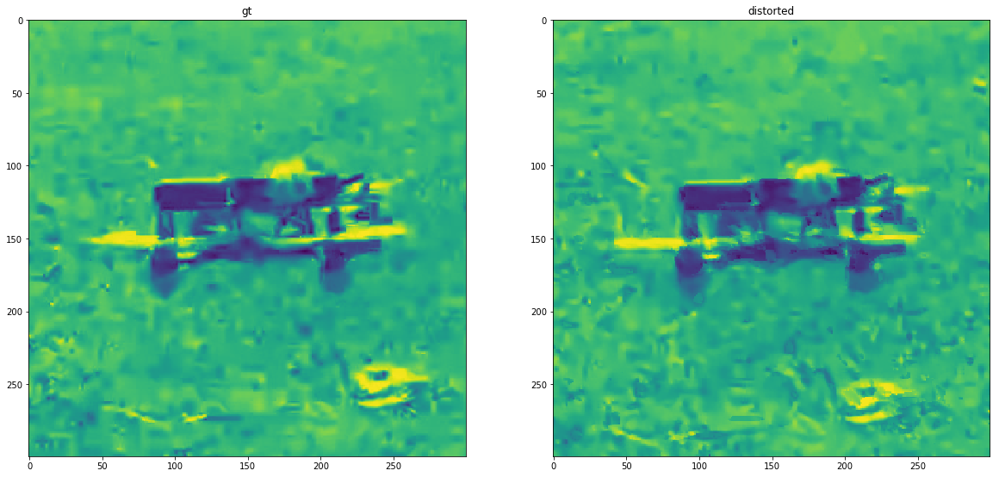

5  distorted img :  psnr= 21.7923808403 ,ssim= 0.723792757012


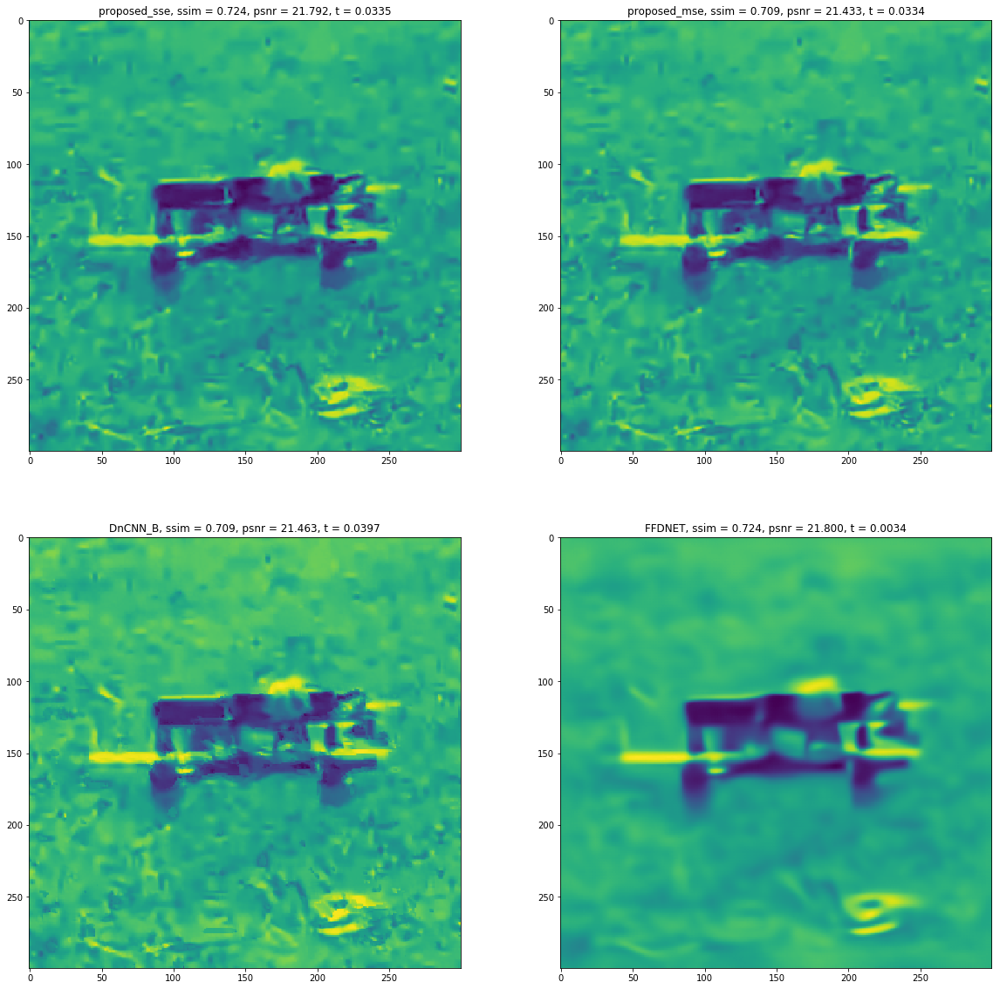

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.918,distorted_min=-0.152,gt_max=0.918,gt_min=0.000


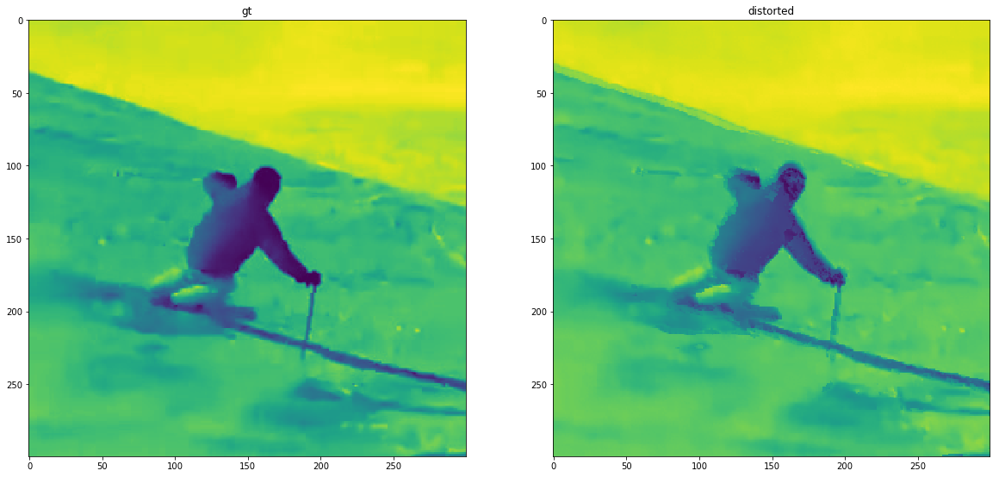

6  distorted img :  psnr= 29.1650165679 ,ssim= 0.926663471681


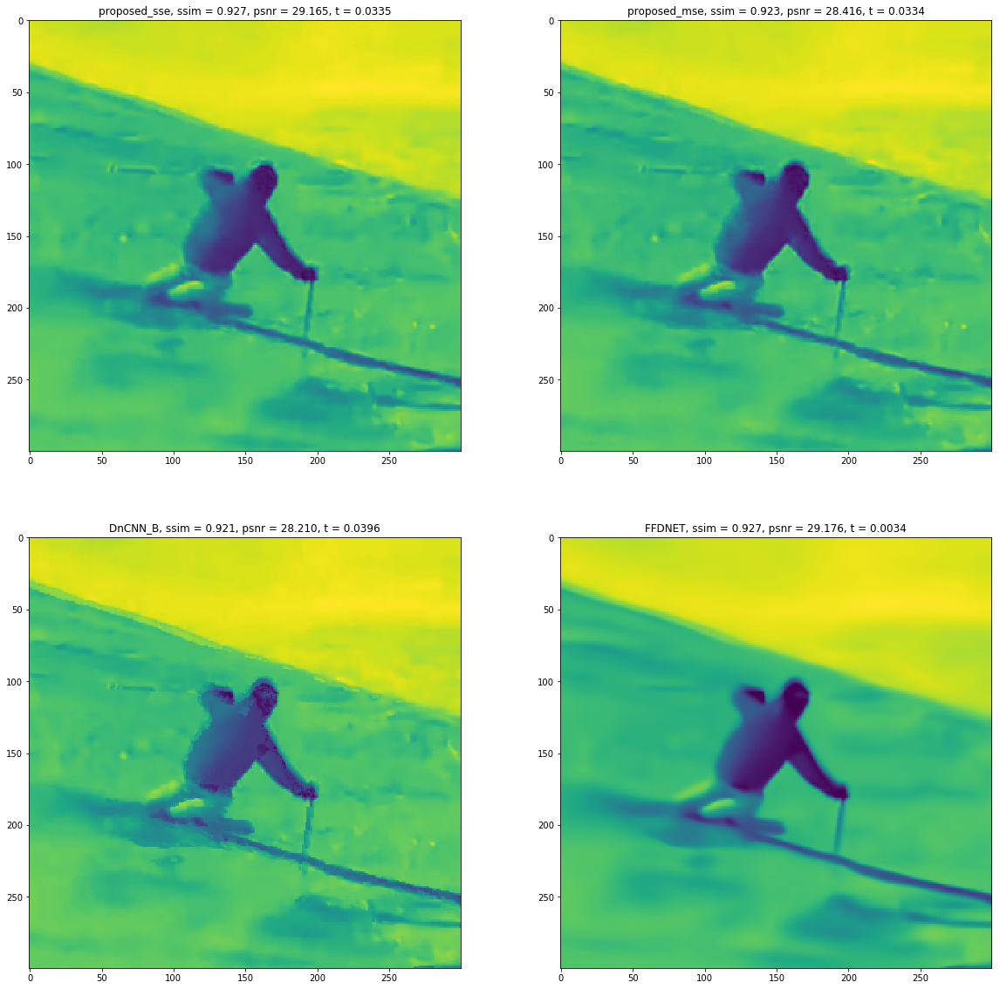

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.951,distorted_min=-0.131,gt_max=0.949,gt_min=0.004


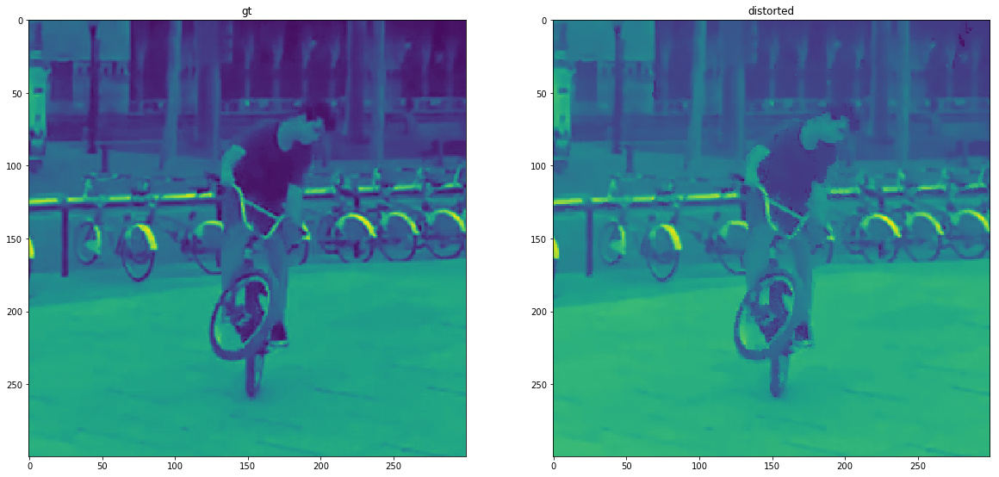

7  distorted img :  psnr= 34.2676713408 ,ssim= 0.978871603509


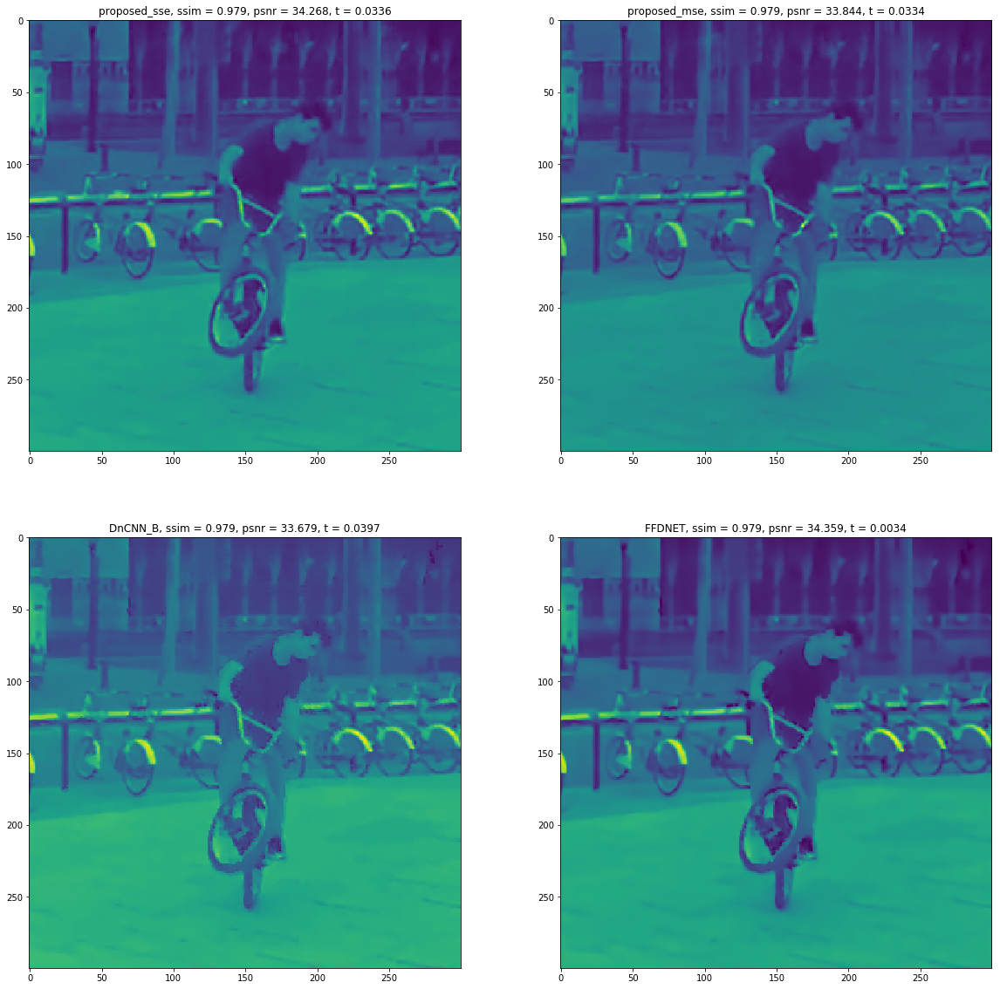

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.969,distorted_min=-0.136,gt_max=0.988,gt_min=0.000


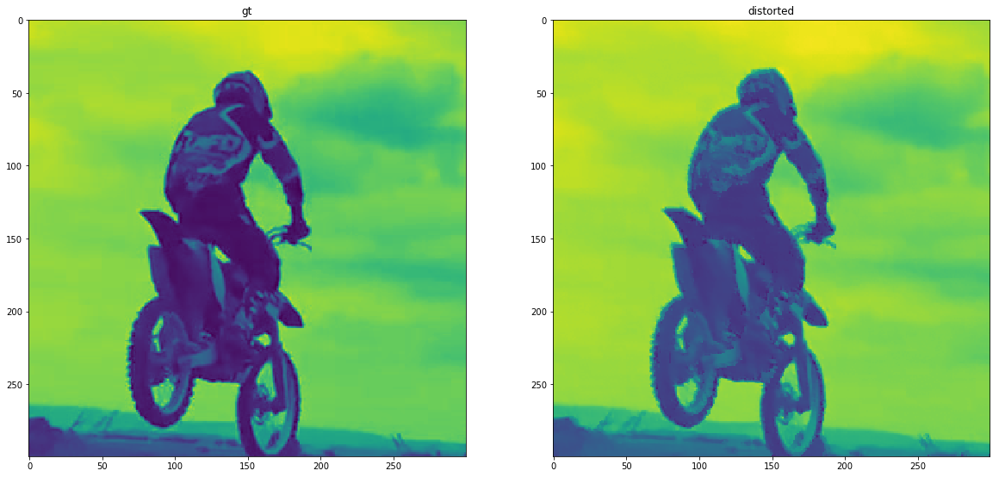

8  distorted img :  psnr= 28.9591742496 ,ssim= 0.964404592559


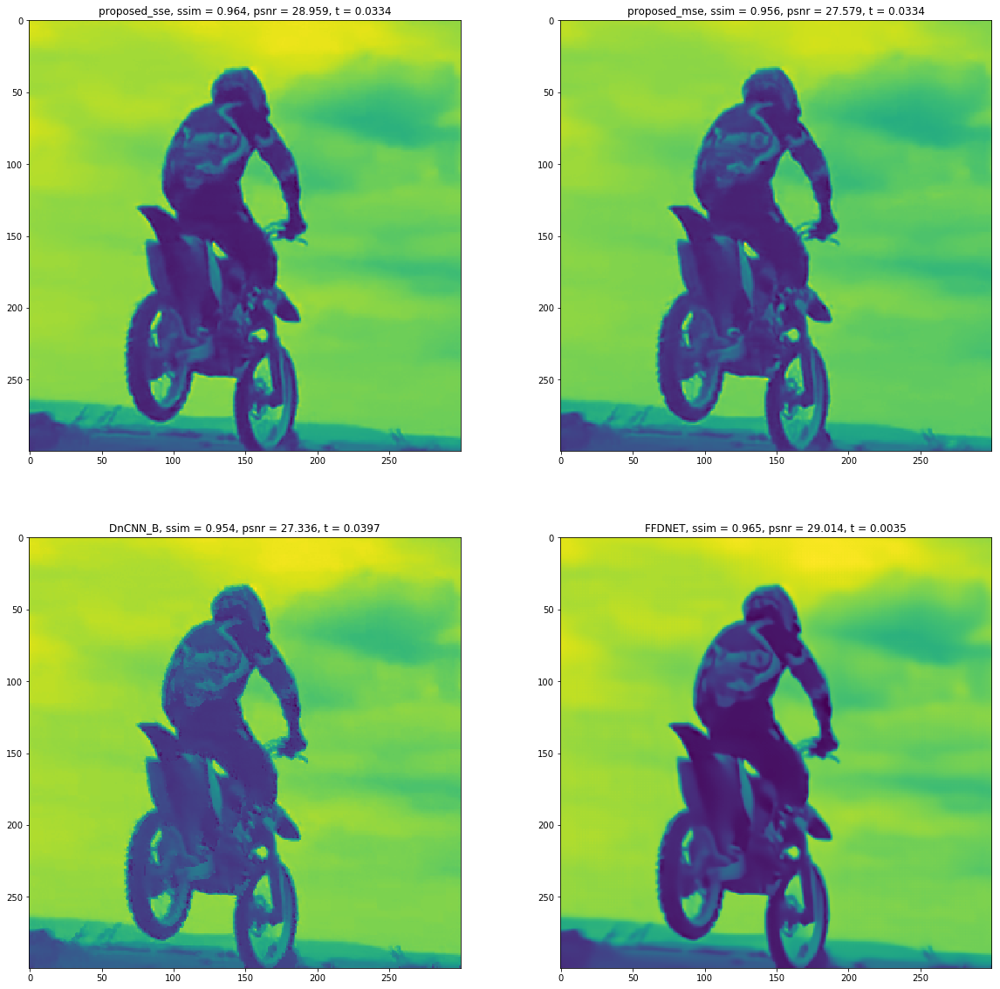

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.986,distorted_min=-0.114,gt_max=0.984,gt_min=0.008


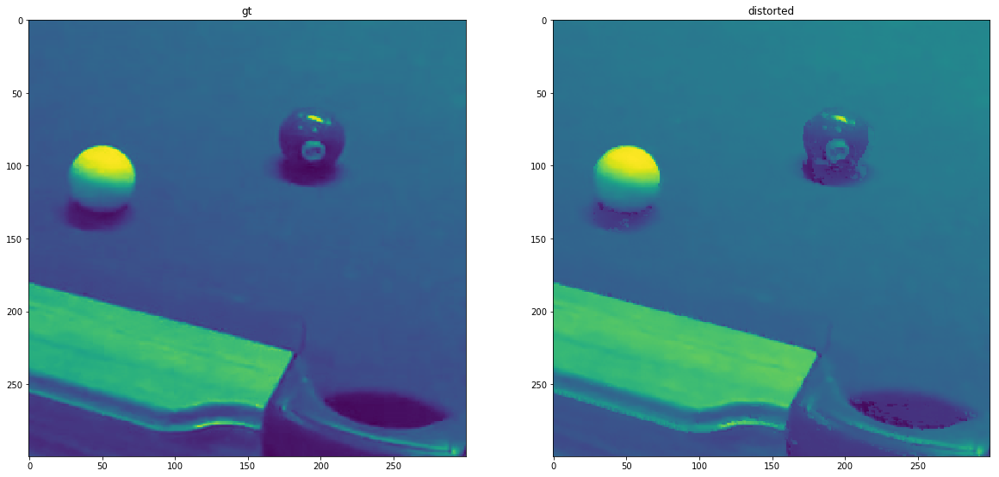

9  distorted img :  psnr= 36.4563718727 ,ssim= 0.98246087723


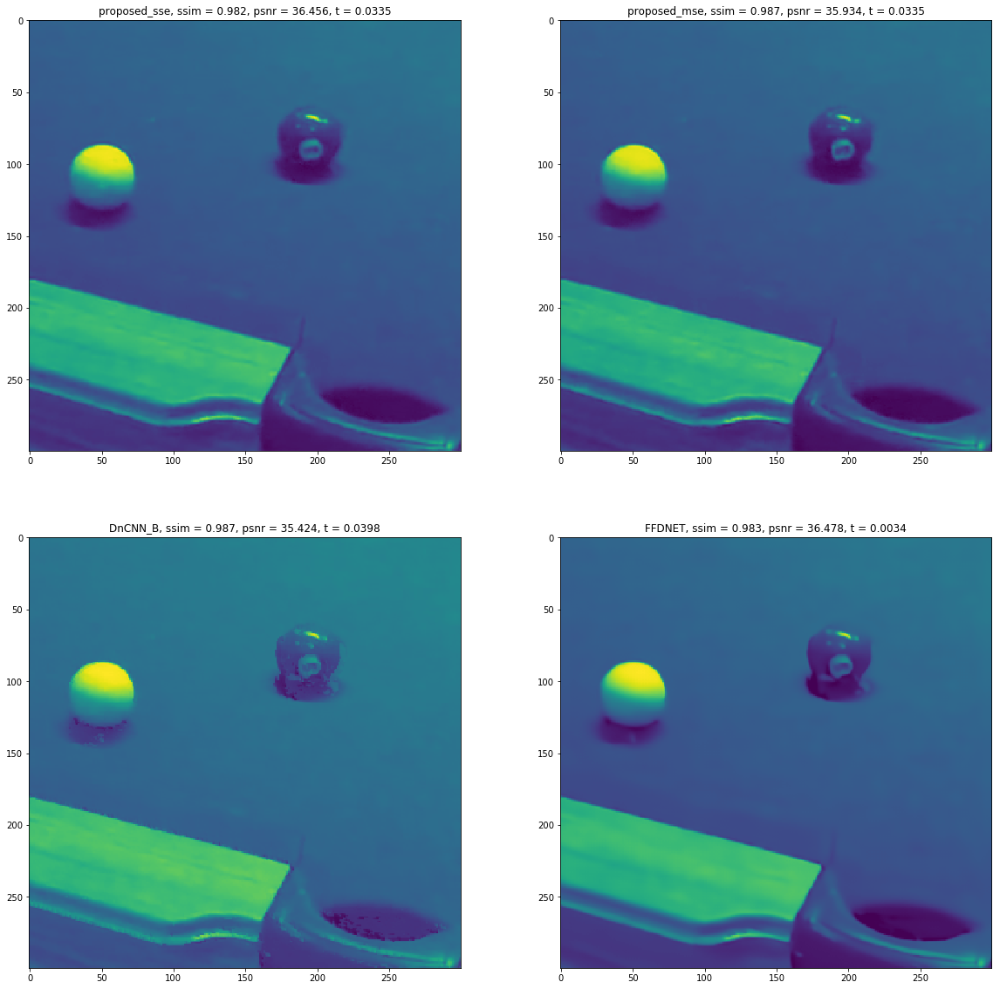

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=0.996,distorted_min=-0.111,gt_max=0.996,gt_min=0.000


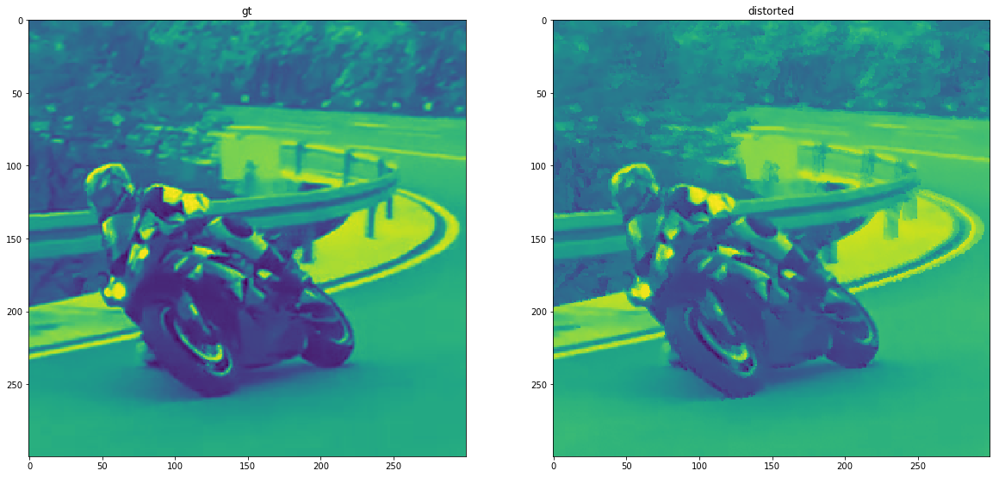

10  distorted img :  psnr= 27.7566498422 ,ssim= 0.910704537885


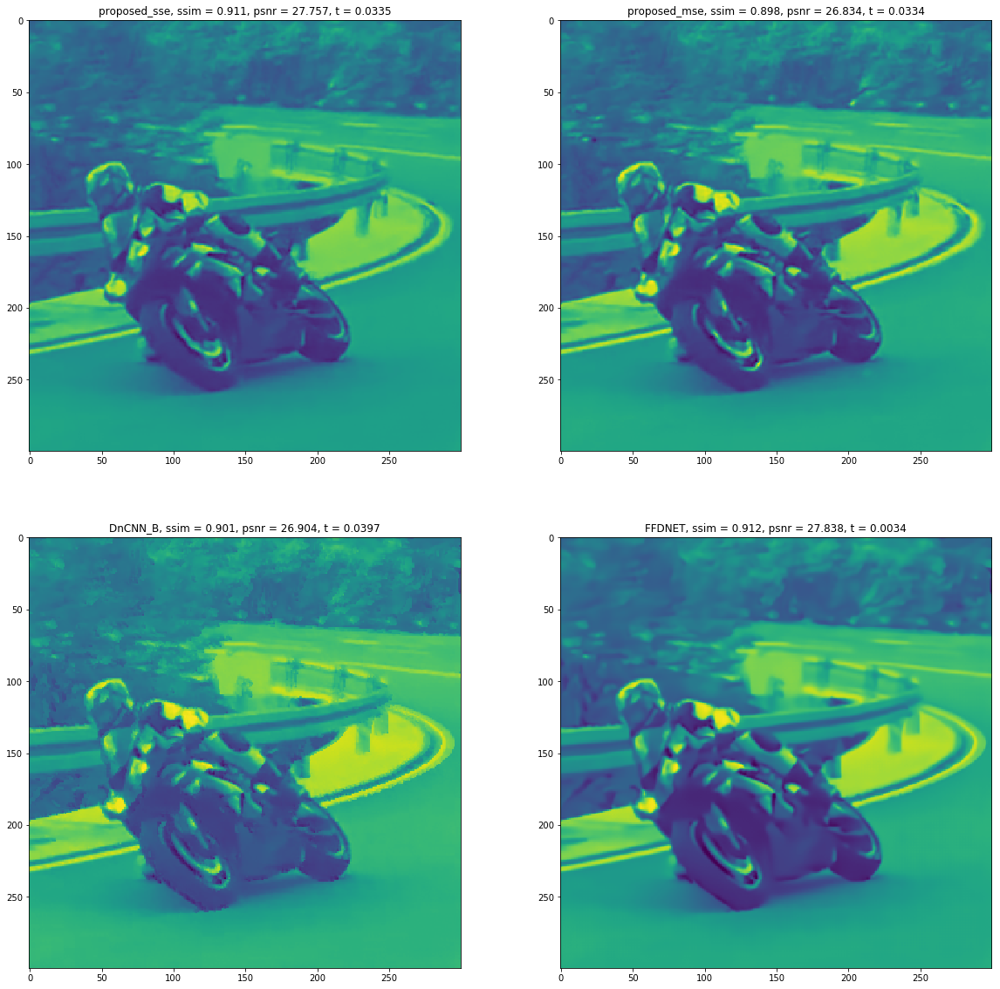

In testing dataset, there are 12 ground truth imgs and 12 distorted imgs
the shape of testing image is (300, 300)
distorted_max=1.001,distorted_min=-0.149,gt_max=1.000,gt_min=0.000


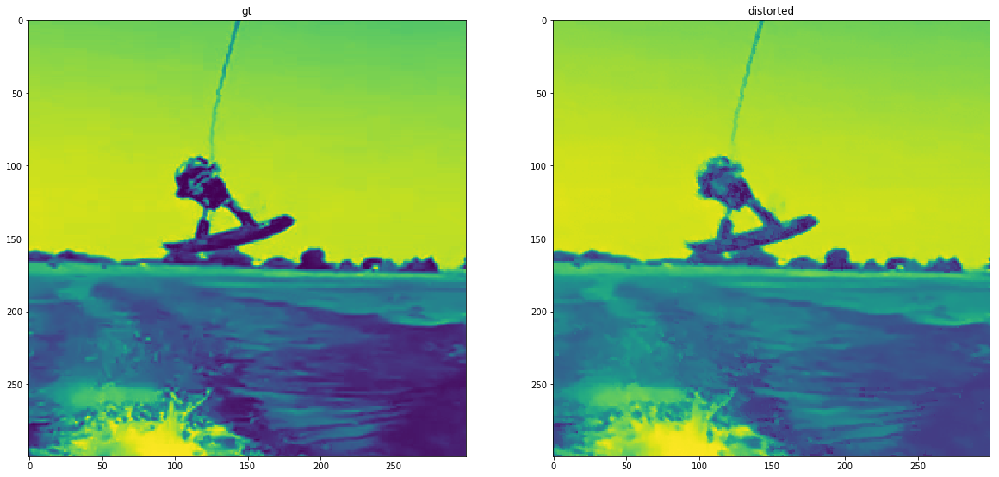

11  distorted img :  psnr= 29.708702218 ,ssim= 0.9631116595


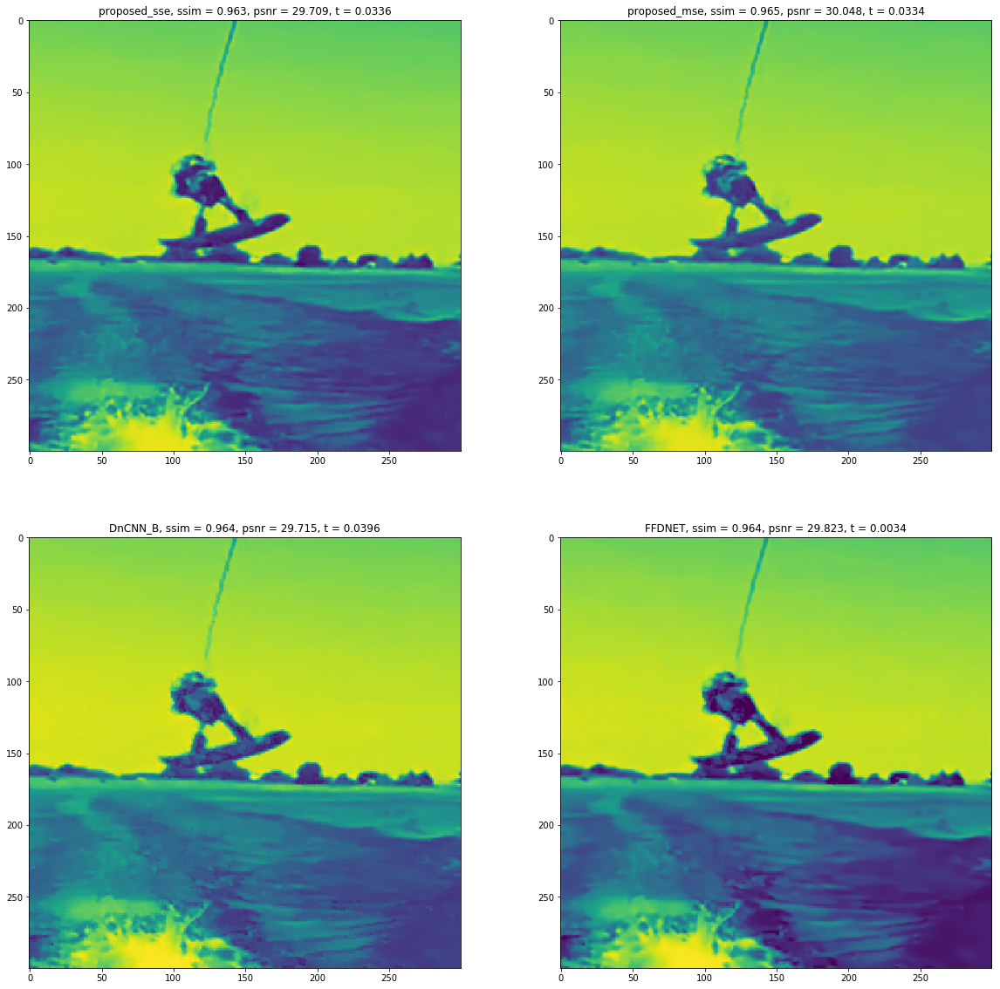

In [15]:
# ssims = np.zeros((len(filename),len(test_model)+1))
# psnrs = np.zeros((len(filename),len(test_model)+1))
for index in range(len(filename)):
    create_folder(fig_save_dir,filename,index)
    ssims = []
    psnrs = []
    predicts = []
    time_costs = []
    # show img info
    ssim,psnr =show_img_info(gts,preds,index,show_info=True)
    ssims.append(ssim)
    psnrs.append(psnr)
    for MODEL_INDEX in range(len(test_model)):
        model = test_model[MODEL_INDEX]
        fig_path = create_folder(fig_save_dir,filename,index)
        para = para_list[MODEL_INDEX]
        
        if model_lib_list[MODEL_INDEX] == "PYTORCH":
            noise_level = find_best_sigma(device,model,index,preds,gts)
        
        
        # run model
        ssim,psnr,predict,time_cost = result_predict(model,model_lib_list[MODEL_INDEX],index,preds,gts,plot_img,save_img,
                                    noise_level,device,filename,fig_path,para)
        ssims.append(ssim)
        psnrs.append(psnr)
        predicts.append(predict)
        time_costs.append(time_cost)
        
    show_predicts(ssims,psnrs,para_list,predicts,time_costs)

